# A pipeline which extracts Tiles with Tissue from Whole Slide Pathology Images

In [ ]:
# Import Scikit and Keras (for ML Classification/Training) libraries
from scipy import ndimage
from skimage.measure import regionprops
from skimage.segmentation import slic

# Import OS, Python Utilities

In [1]:
import os
import sys
import json
import time

import numpy as np
import dask
import h5py
from ctk_cli import CLIArgumentParser
import logging
logging.basicConfig(level=logging.CRITICAL)
import matplotlib.pyplot as plt
import glob
import pandas as pd

In [2]:
sys.path.append("/HistomicsTK/server/cli_common/")
import utils as cli_utils

INFO:girder:Created LRU Cache for 'tilesource' with 104 maximum size
INFO:root:Notice: Could not import MapnikTileSource


# Import HistomicsTK libraries

In [3]:
import histomicstk.preprocessing.color_normalization as htk_cnorm
import histomicstk.preprocessing.color_deconvolution as htk_cdeconv
import histomicstk.segmentation as htk_seg

import histomicstk.utils as htk_utils

# Import large_Image library

In [4]:
import large_image

# Get Tile Source from large_image library

In [5]:
img_path= "/data/train/gbm/TCGA-02-0001-01Z-00-DX3.2836ce55-491f-4d86-99b1-668946927af8.svs"
slideBaseName = os.path.basename(img_path).split(".")[0]
print slideBaseName
out_path = "/data/output/results/"
ts = large_image.getTileSource(img_path)

INFO:girder:Cannot use memcached for caching.
INFO:girder:Using python for large_image caching


TCGA-02-0001-01Z-00-DX3
Using python for large_image caching


In [6]:
ts_metadata = ts.getMetadata()
tile_magnification = ts_metadata['magnification']

In [7]:
is_wsi = tile_magnification is not None

# Compute colorspace statistics (mean, variance) for whole slide
# Reinhard_Normalization (Img_path, <Fraction of pixels to sample>, <Analysis Magnification>)
#if is_wsi:
#    wsi_mean, wsi_stddev = htk_cnorm.reinhard_stats(img_path, 0.1, 20)

# Compute tissue/foreground mask at low-res for whole slide images

In [8]:
if is_wsi:
    im_fgnd_mask_lres, fgnd_seg_scale = cli_utils.segment_wsi_foreground_at_low_res(ts)

# Compute foreground fraction of tiles

In [21]:
analysis_tile_size = 256
analysis_mag = 20
kwargs = {
    'tile_size': {'width': analysis_tile_size},
    'scale': {'magnification': analysis_mag},
}

start_time = time.time()
total_tiles = ts.getSingleTile(**kwargs)['iterator_range']['position']
print 'Number of tiles = %d' % total_tiles

tile_fgnd_frac_list = htk_utils.compute_tile_foreground_fraction(
    img_path, im_fgnd_mask_lres, fgnd_seg_scale, **kwargs)

#The minimum amount of foreground  fraction that must be present in a tile for it to be analyzed=0.001
num_fgnd_tiles = np.count_nonzero(tile_fgnd_frac_list >= 0.001)

percent_fgnd_tiles = 100.0 * num_fgnd_tiles / total_tiles

fgnd_frac_comp_time = time.time() - start_time

print 'Number of foreground tiles = %d (%.2f%%)' % (num_fgnd_tiles, percent_fgnd_tiles)

print 'Time taken = %s' % cli_utils.disp_time_hms(fgnd_frac_comp_time)

Number of tiles = 27540


In [22]:
total_tiles

27540

ValueError: num must be 1 <= num <= 50, not 51

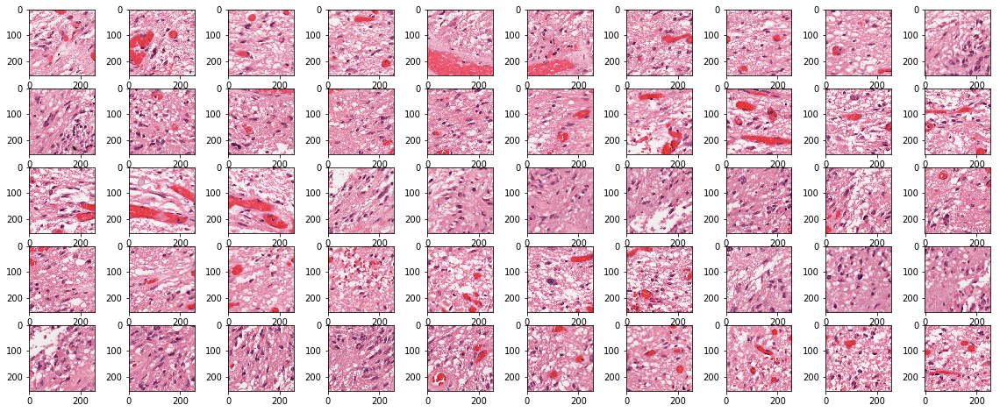

In [32]:
# To show 100 tiles on a plot diagram
fig=plt.figure(figsize=(8, 8))
columns = 10
rows = 10
idx = 1

for i, p in enumerate(range(0, total_tiles)):
    tile_info = ts.getSingleTile(tile_position=p,**kwargs)
    tile = tile_info['tile']
    avg = np.average(tile)
    if avg > 150 and avg < 210:
        fig.add_subplot(rows,columns,idx)
        plt.imshow(tile)
        idx+=1        
plt.show(fig)        

# Getting Tile Information

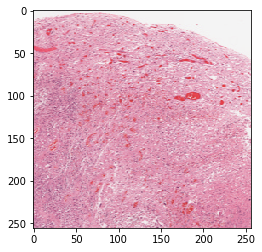

Tile_idx:11
GlobalX_Position:45056
GlobalX_top:0
avg: 206


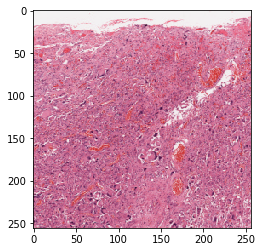

Tile_idx:17
GlobalX_Position:16384
GlobalX_top:4096
avg: 185


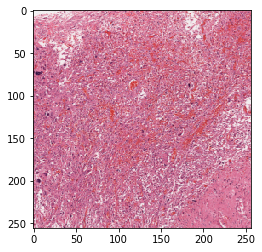

Tile_idx:18
GlobalX_Position:20480
GlobalX_top:4096
avg: 183


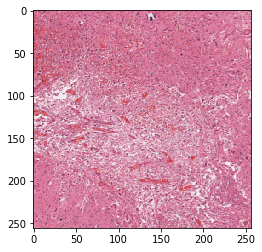

Tile_idx:19
GlobalX_Position:24576
GlobalX_top:4096
avg: 189


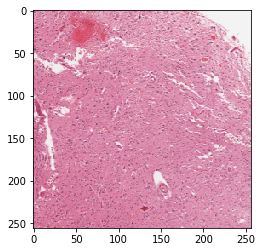

Tile_idx:20
GlobalX_Position:28672
GlobalX_top:4096
avg: 196


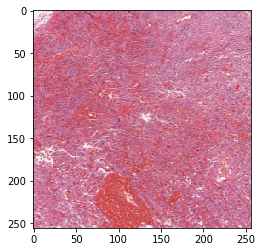

Tile_idx:23
GlobalX_Position:40960
GlobalX_top:4096
avg: 178


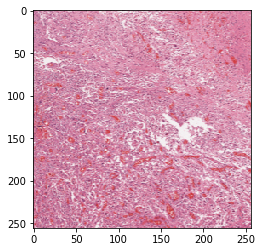

Tile_idx:24
GlobalX_Position:45056
GlobalX_top:4096
avg: 195


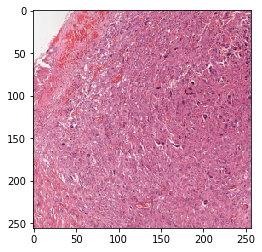

Tile_idx:29
GlobalX_Position:12288
GlobalX_top:8192
avg: 183


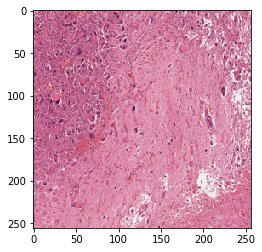

Tile_idx:30
GlobalX_Position:16384
GlobalX_top:8192
avg: 187


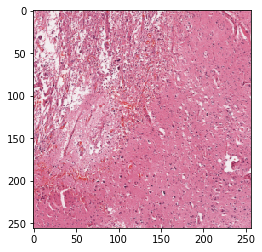

Tile_idx:31
GlobalX_Position:20480
GlobalX_top:8192
avg: 190


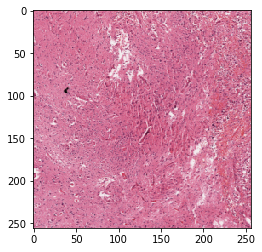

Tile_idx:32
GlobalX_Position:24576
GlobalX_top:8192
avg: 184


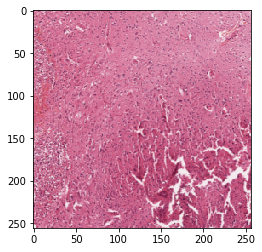

Tile_idx:33
GlobalX_Position:28672
GlobalX_top:8192
avg: 179


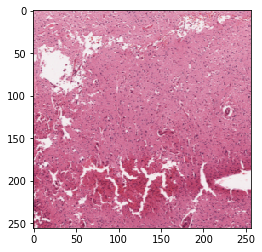

Tile_idx:34
GlobalX_Position:32768
GlobalX_top:8192
avg: 184


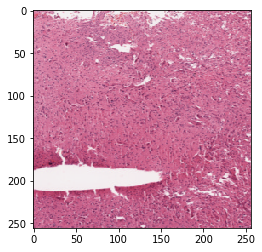

Tile_idx:35
GlobalX_Position:36864
GlobalX_top:8192
avg: 182


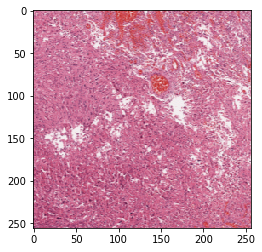

Tile_idx:36
GlobalX_Position:40960
GlobalX_top:8192
avg: 183


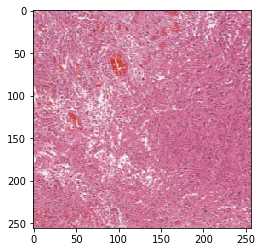

Tile_idx:37
GlobalX_Position:45056
GlobalX_top:8192
avg: 185


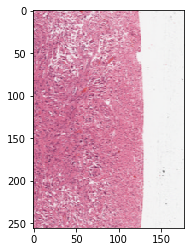

Tile_idx:38
GlobalX_Position:49152
GlobalX_top:8192
avg: 205


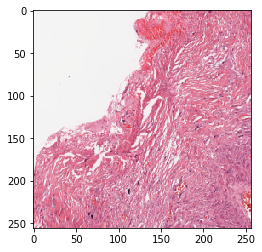

Tile_idx:41
GlobalX_Position:8192
GlobalX_top:12288
avg: 205


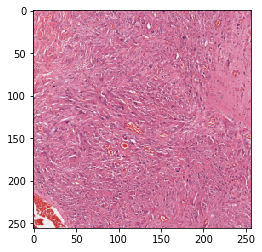

Tile_idx:42
GlobalX_Position:12288
GlobalX_top:12288
avg: 183


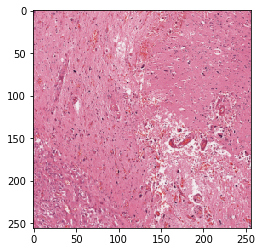

Tile_idx:43
GlobalX_Position:16384
GlobalX_top:12288
avg: 191


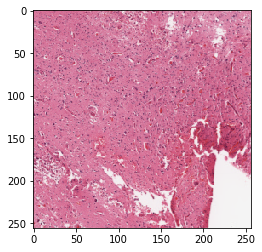

Tile_idx:44
GlobalX_Position:20480
GlobalX_top:12288
avg: 187


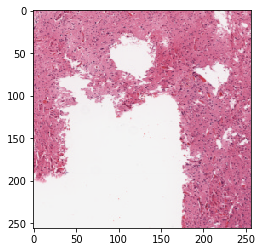

Tile_idx:45
GlobalX_Position:24576
GlobalX_top:12288
avg: 207


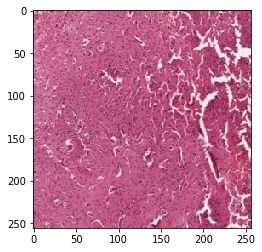

Tile_idx:46
GlobalX_Position:28672
GlobalX_top:12288
avg: 168


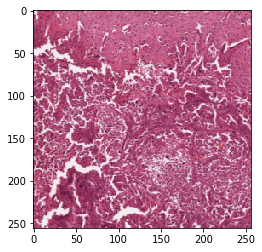

Tile_idx:47
GlobalX_Position:32768
GlobalX_top:12288
avg: 167


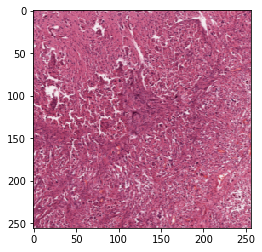

Tile_idx:48
GlobalX_Position:36864
GlobalX_top:12288
avg: 164


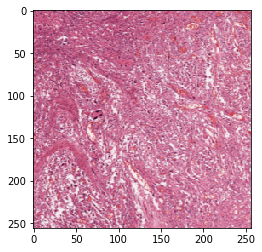

Tile_idx:49
GlobalX_Position:40960
GlobalX_top:12288
avg: 184


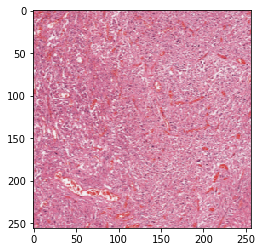

Tile_idx:50
GlobalX_Position:45056
GlobalX_top:12288
avg: 191


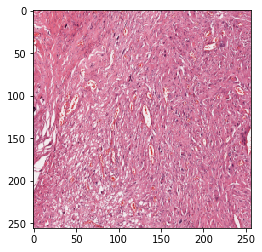

Tile_idx:54
GlobalX_Position:8192
GlobalX_top:16384
avg: 188


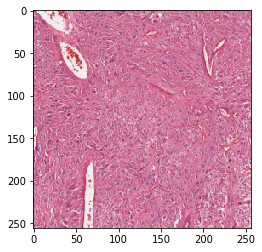

Tile_idx:55
GlobalX_Position:12288
GlobalX_top:16384
avg: 184


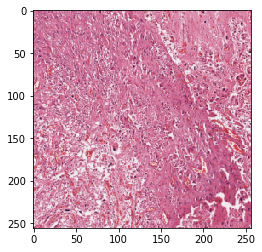

Tile_idx:56
GlobalX_Position:16384
GlobalX_top:16384
avg: 187


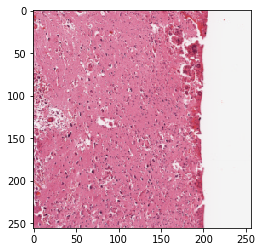

Tile_idx:57
GlobalX_Position:20480
GlobalX_top:16384
avg: 198


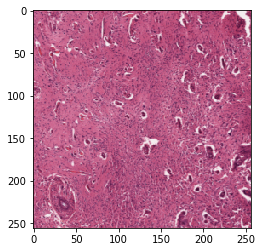

Tile_idx:59
GlobalX_Position:28672
GlobalX_top:16384
avg: 164


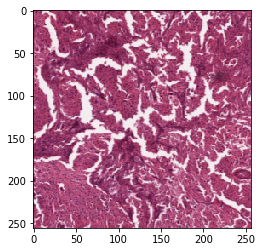

Tile_idx:60
GlobalX_Position:32768
GlobalX_top:16384
avg: 163


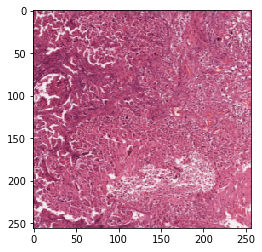

Tile_idx:61
GlobalX_Position:36864
GlobalX_top:16384
avg: 168


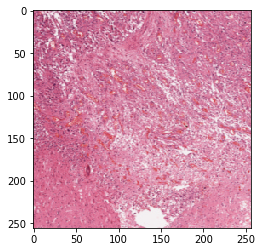

Tile_idx:62
GlobalX_Position:40960
GlobalX_top:16384
avg: 190


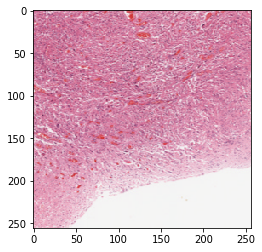

Tile_idx:63
GlobalX_Position:45056
GlobalX_top:16384
avg: 204


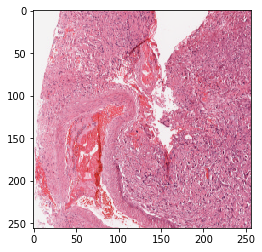

Tile_idx:65
GlobalX_Position:0
GlobalX_top:20480
avg: 194


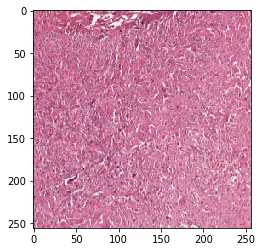

Tile_idx:66
GlobalX_Position:4096
GlobalX_top:20480
avg: 184


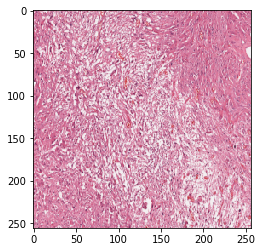

Tile_idx:67
GlobalX_Position:8192
GlobalX_top:20480
avg: 198


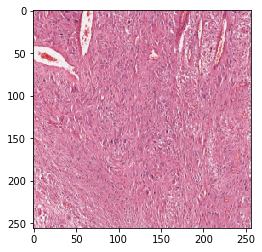

Tile_idx:68
GlobalX_Position:12288
GlobalX_top:20480
avg: 189


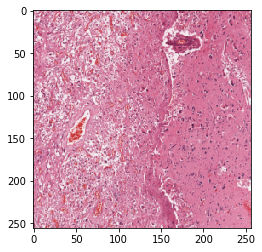

Tile_idx:69
GlobalX_Position:16384
GlobalX_top:20480
avg: 190


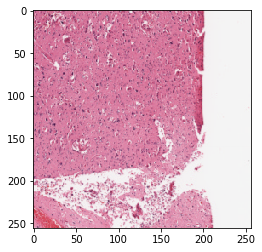

Tile_idx:70
GlobalX_Position:20480
GlobalX_top:20480
avg: 205


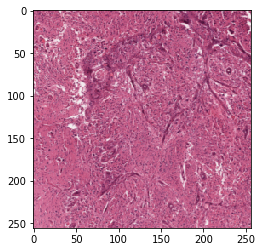

Tile_idx:72
GlobalX_Position:28672
GlobalX_top:20480
avg: 167


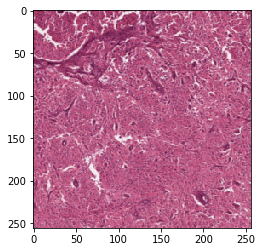

Tile_idx:73
GlobalX_Position:32768
GlobalX_top:20480
avg: 166


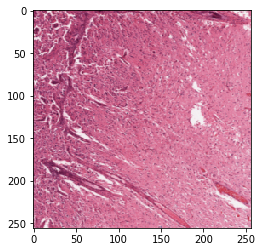

Tile_idx:74
GlobalX_Position:36864
GlobalX_top:20480
avg: 180


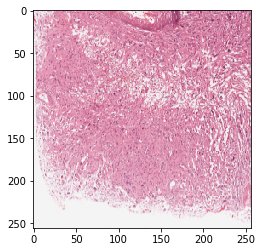

Tile_idx:78
GlobalX_Position:0
GlobalX_top:24576
avg: 208


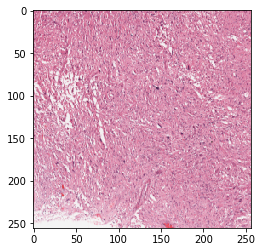

Tile_idx:79
GlobalX_Position:4096
GlobalX_top:24576
avg: 199


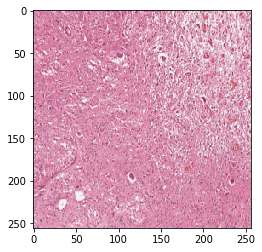

Tile_idx:80
GlobalX_Position:8192
GlobalX_top:24576
avg: 198


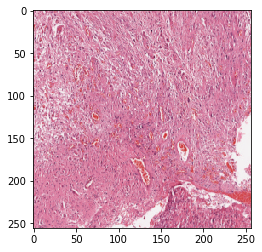

Tile_idx:81
GlobalX_Position:12288
GlobalX_top:24576
avg: 193


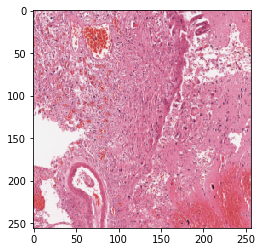

Tile_idx:82
GlobalX_Position:16384
GlobalX_top:24576
avg: 194


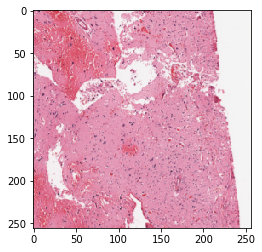

Tile_idx:83
GlobalX_Position:20480
GlobalX_top:24576
avg: 204


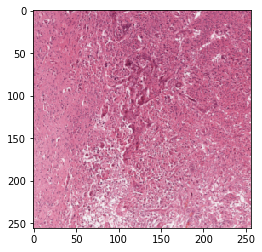

Tile_idx:85
GlobalX_Position:28672
GlobalX_top:24576
avg: 182


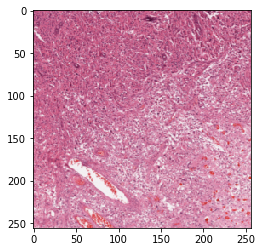

Tile_idx:86
GlobalX_Position:32768
GlobalX_top:24576
avg: 185


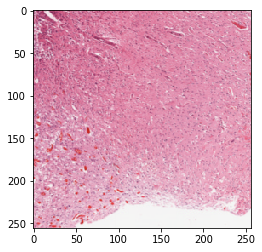

Tile_idx:87
GlobalX_Position:36864
GlobalX_top:24576
avg: 202


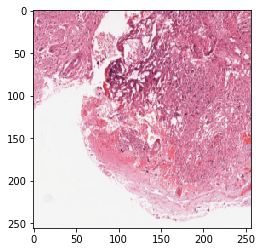

Tile_idx:94
GlobalX_Position:12288
GlobalX_top:28672
avg: 209


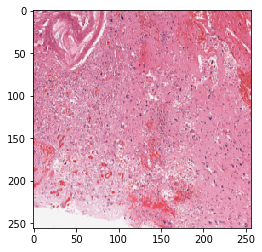

Tile_idx:95
GlobalX_Position:16384
GlobalX_top:28672
avg: 197


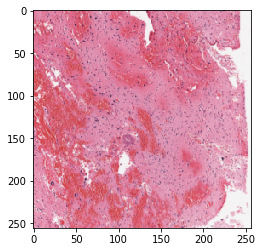

Tile_idx:96
GlobalX_Position:20480
GlobalX_top:28672
avg: 192


In [12]:
for i, p in enumerate(range(0, total_tiles)):
    tile_info = ts.getSingleTile(tile_position=p,**kwargs)
    tile = tile_info['tile']
    avg = np.average(tile)
    if avg > 150 and avg < 210:
        plt.figure()
        plt.imshow(tile)
        tilename = slideBaseName + '_%d_%d_%d.png' % (p, tile_info['gx'], tile_info['gx']) 
        plt.savefig(out_path + tilename)
        plt.show()
        print ('Tile_idx:%d'% p)
        print ('GlobalX_Position:%d'% tile_info['gx'])
        print ('GlobalX_top:%d' % tile_info['gy'])
        print ('avg: %d' % avg)

# Saving the tileinfo into a file

In [ ]:
tileInfo = {}

for i, p in enumerate(range(0, total_tiles)):
    tile_info = ts.getSingleTile(tile_position=p,**kwargs)
    tileInfo['tile_data'] = tile_info['tile']
    tileInfo['GlobalX_Position'] = tile_info['gx']
    tileInfo['Global_Top'] = tile_info['gy']
    tileInfo['tile_scale'] = tile_info['gwidth']/tile_info['width']
    
    # tile statistics for training classifier
    tileInfo['tile_avg'] = np.average(tile_info['tile'])
       
    df = pd.DataFrame.from_dict([tileInfo])
    filename = slideBaseName + '_tileInfo.csv' 
    df.to_csv(out_path+filename, header=True, index=True, mode='a')
print('>> "Tile information wrote on to a file') 

# To get Tile Information for all the images in the listed folder

In [ ]:
t = ['a','b','c','d']
t[2:4]

In [ ]:
cohortSlideSet = glob.glob("/data/train/gbm/*DX*.svs")

tileInfo = {}

analysis_tile_size = 2048
analysis_mag = 20
kwargs = {
    'tile_size': {'width': analysis_tile_size},
    'scale': {'magnification': analysis_mag},
}

slide_len = len (cohortSlideSet)
for i in cohortSlideSet[0:slide_len+1]:
    slideBaseName = os.path.basename(i).split(".")[0]
    ts = large_image.getTileSource(i)
    total_tiles = ts.getSingleTile(**kwargs)['iterator_range']['position']  
    for i, p in enumerate(range(0, total_tiles)):
        tile_info = ts.getSingleTile(tile_position=p,**kwargs)
        tileInfo['filename']= " .svs"
        tileInfo['tile_data'] = tile_info['tile']
        tileInfo['GlobalX_Position'] = tile_info['gx']
        tileInfo['Global_Top'] = tile_info['gy']
        tileInfo['tile_scale'] = tile_info['gwidth']/tile_info['width']
    
        # tile statistics for training classifier
        tileInfo['tile_avg'] = np.average(tile_info['tile'])
    
        df = pd.DataFrame.from_dict([tileInfo])
        filename = slideBaseName + '_tileInfo.csv' 
        df.to_csv(filename, header=True, index=True, mode='a')
    
        tile = tile_info['tile']
        avg = np.average(tile)
        if avg > 150 and avg < 210:
            plt.figure()
            #plt.imshow(tile)
            tilename = slideBaseName + '_%d_%d_%d.png' % (p, tile_info['gx'], tile_info['gx']) 
            plt.savefig(out_path + tilename)
            plt.show()
            print ('Tile_idx:%d'% p)
            print ('GlobalX_Position:%d'% tile_info['gx'])
            print ('GlobalX_top:%d' % tile_info['gy'])
            print ('avg: %d' % avg)
    
print('>> "Tile information wrote on to a file')  

# Other Tile Statistics and Tasks

# Compute Tiles generation using TileIterator

In [ ]:
count = 0
for tile_info in ts.tileIterator(**kwargs):
    tile_position = tile_info['tile_position']['position']
    count+=1
    tile = tile_info['tile']
    avg = np.average(tile)
    #if avg > 100 and avg < 200:
    plt.figure()
    plt.imshow(tile)
    plt.show()
    tilename = slideBaseName + '_%d.jpg'% tile_position 
    plt.savefig(out_path + tilename)
    print ('Tile_idx:%d'% p)
    print ('GlobalX_Position:%d'% tile_info['gx'])
    print ('GlobalX_top:%d' % tile_info['gy'])
    print ('avg: %d' % avg)

print count

In [ ]:
tileMeans = []
tileWeights = []
magnification=None
import numpy
# iterate through the tiles at a particular magnification:
for tile in ts.tileIterator(format=large_image.tilesource.TILE_FORMAT_NUMPY,scale={'magnification': magnification},
                                resample=True):
    # The tile image data is in tile['tile'] and is a numpy
    # multi-dimensional array
    mean = numpy.mean(tile['tile'], axis=(0, 1))
    tileMeans.append(mean)                                                          
    tileWeights.append(tile['width'] * tile['height'])
    print('x: %d  y: %d  w: %d  h: %d  mag: %g  color: %g %g %g' % (tile['x'], tile['y'], tile['width'], tile['height'],
                                                                    tile['magnification'], mean[0], mean[1], mean[2]))
    mean = numpy.average(tileMeans, axis=0, weights=tileWeights)
    print('Average color: %g %g %g' % (mean[0], mean[1], mean[2]))